# Check output without orography and stochastics

In [1]:
from cdv_utils import (
    load_d, build_df, add_density_column, compute_eof, plot_scatter,
    generate_fourier_mode, plot_density_heatmap, plot_fourier_mode,
    save_time_step_plots,
    save_single_frame, save_time_step_plots_parallel, make_scatter_backgrounds,
    combine_binary_files
)

dims = 6
sample_num = 200000

Calculated neighbor counts for 200000 points


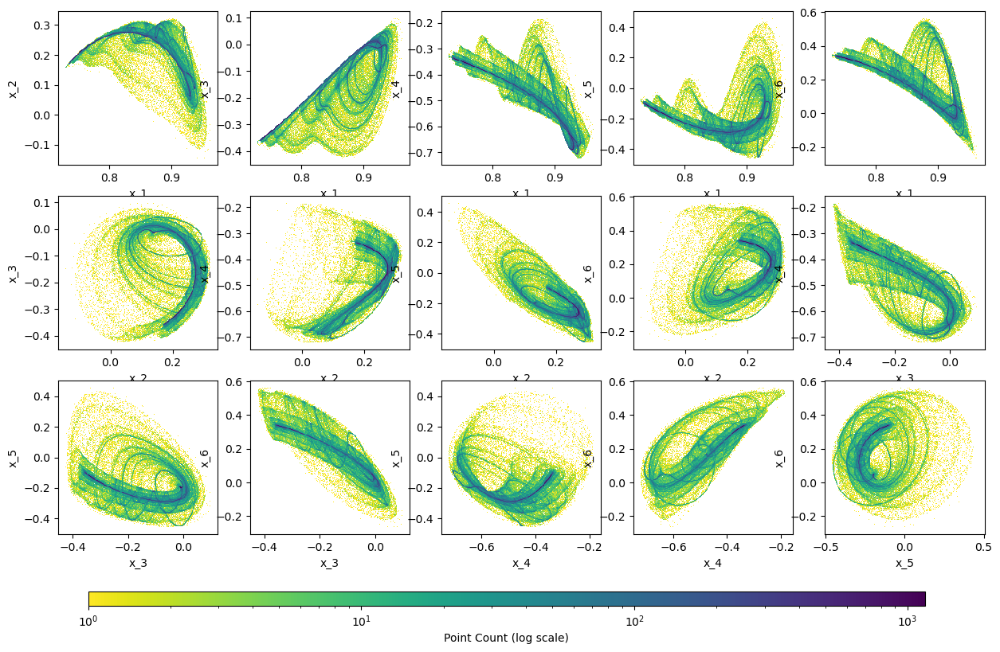

In [2]:
state_vector = load_d('./cdv_model/dataOro20.bin', dims, sample_num)
df = build_df(state_vector, dims)
results = compute_eof(df, n_modes=6)
scores_df = results['scores_df']
df = add_density_column(df, state_vector, 0.01)
hists = plot_density_heatmap(df)

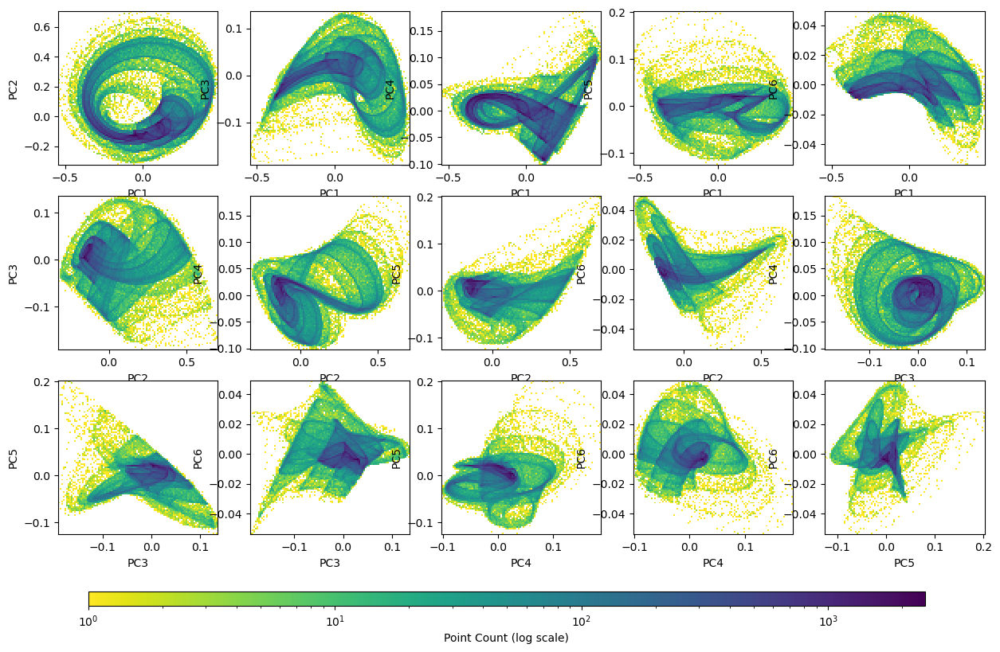

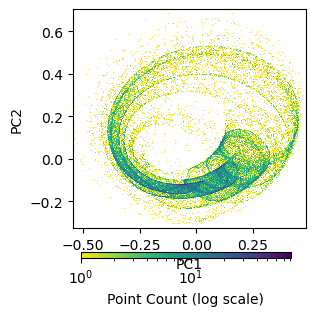

In [66]:
histograms = plot_density_heatmap(scores_df, bins=100, cmap='viridis_r')
histogram1 = plot_density_heatmap(scores_df, bins=500, columns=['PC1', 'PC2'])

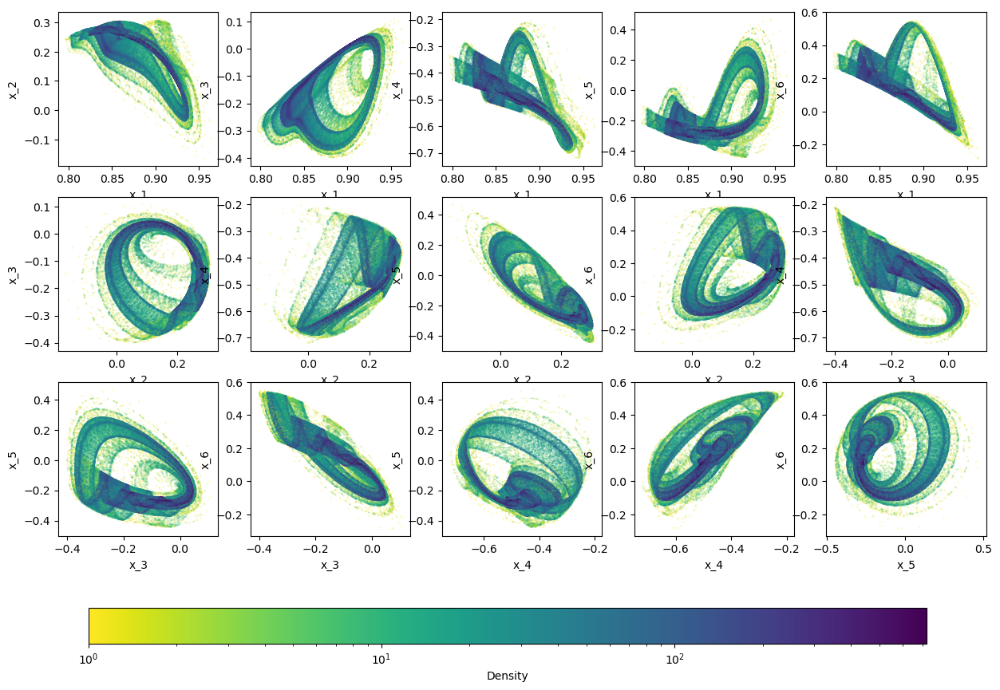

(<Figure size 1500x900 with 16 Axes>, <Axes: xlabel='x_5', ylabel='x_6'>)

In [4]:
plot_scatter(df, "Density", norm=LogNorm())

In [3]:
ftles = load_d("cdv_model/dataOro20ftle.bin", dims, sample_num)

In [53]:
ftle_df = build_df(ftles)
df["ftle_max"] = np.max(ftles, axis=1)
df["pos_ftle"] = np.sum(ftles > 0, axis=1, dtype=int)
scores_df["ftle_max"] = np.max(ftles, axis=1)
scores_df["pos_ftle"] = np.sum(ftles > 0, axis=1, dtype=int)

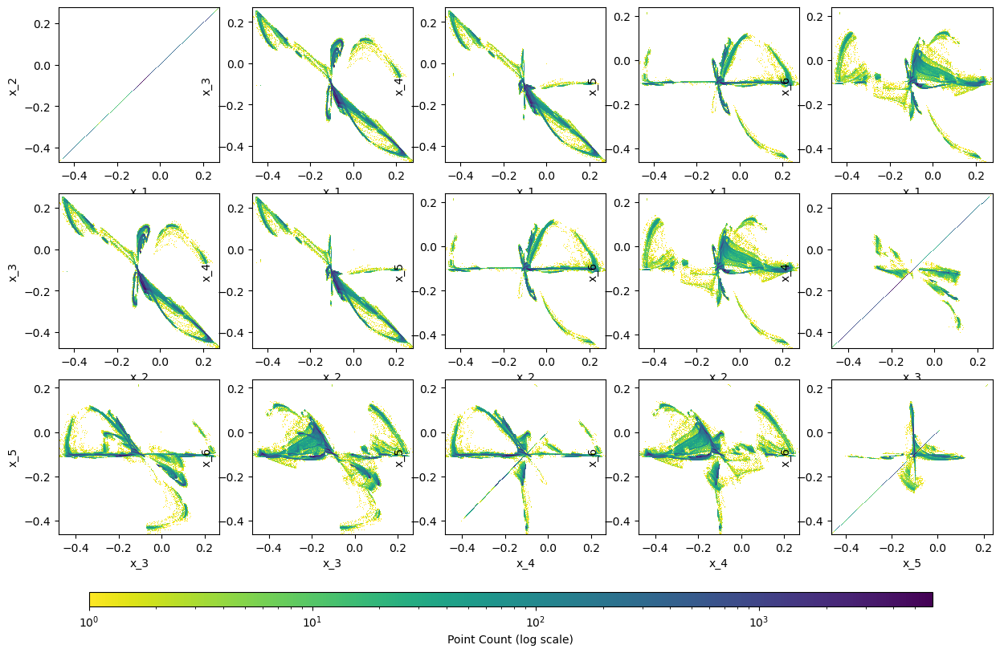

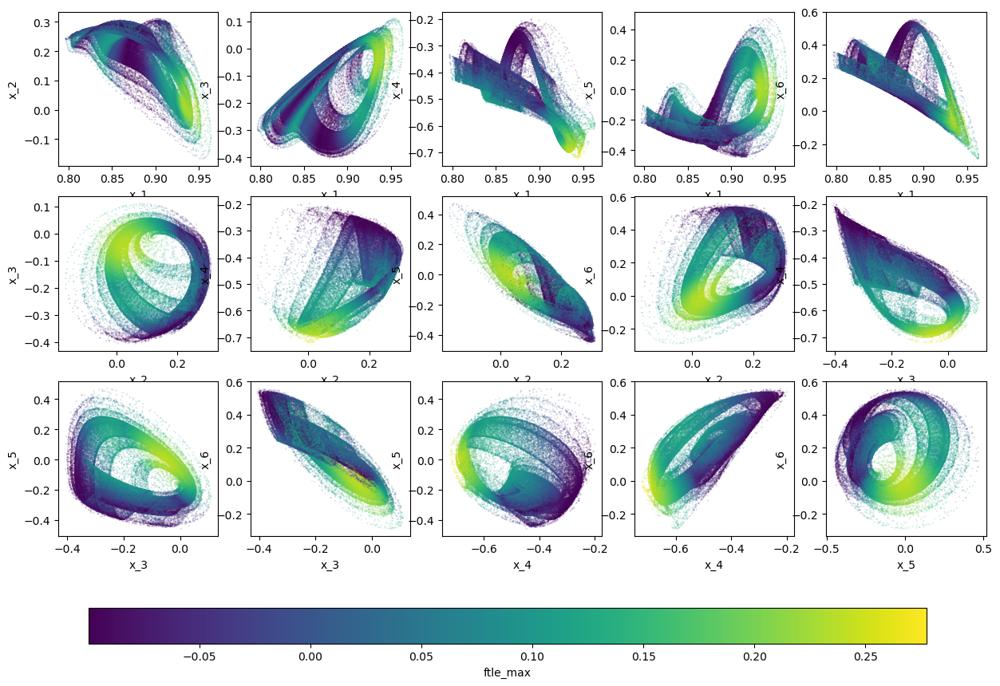

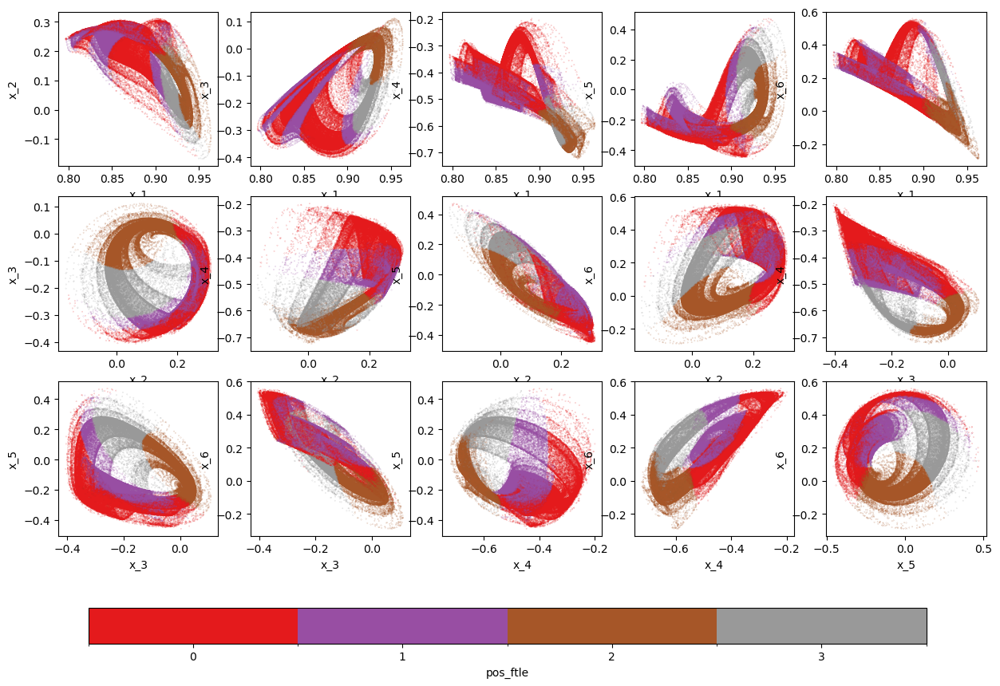

(<Figure size 1500x900 with 16 Axes>, <Axes: xlabel='x_5', ylabel='x_6'>)

In [5]:
hists = plot_density_heatmap(ftle_df)
plot_scatter(df, "ftle_max", cmap='viridis')
plot_scatter(df, "pos_ftle", cmap='Set1', categorical=True)

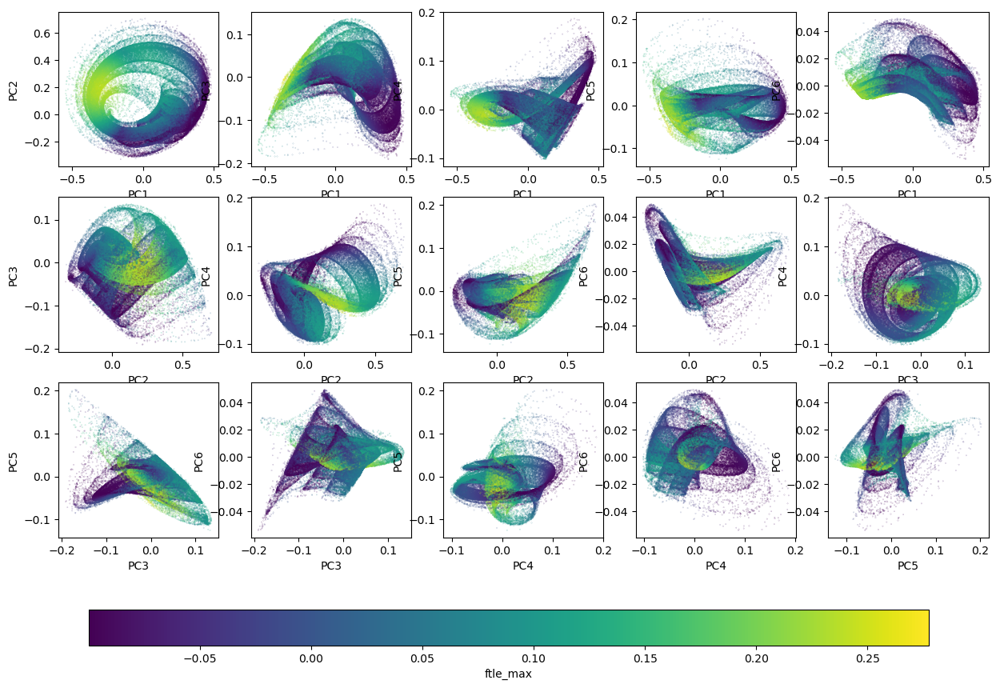

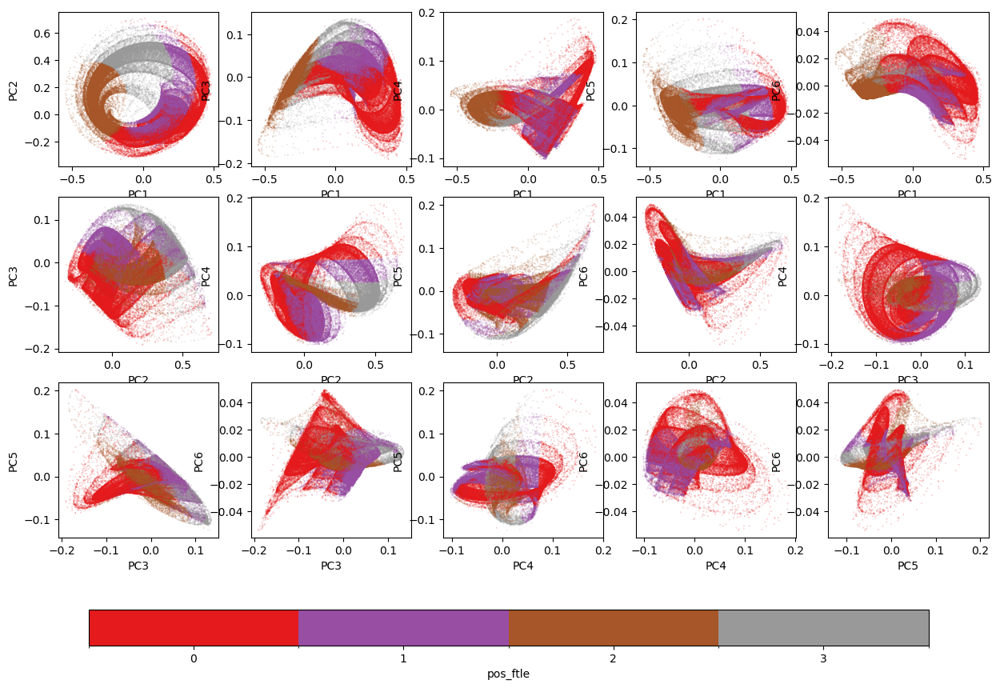

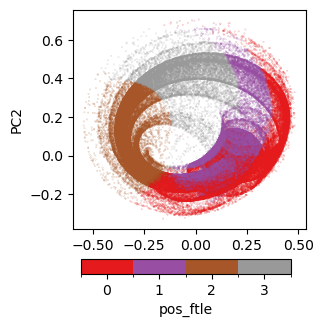

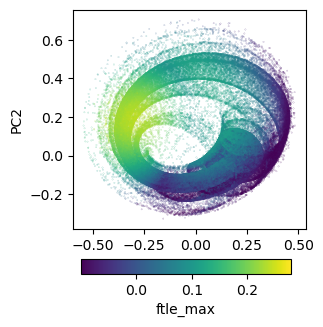

(<Figure size 300x300 with 2 Axes>, <Axes: xlabel='PC1', ylabel='PC2'>)

In [6]:
scats_ftle_max = plot_scatter(scores_df, "ftle_max", cmap='viridis')
scats_pos_ftle = plot_scatter(
    scores_df, "pos_ftle", cmap='Set1', categorical=True)
plot_scatter(scores_df, "pos_ftle", cmap='Set1',
             categorical=True, columns=['PC1', 'PC2'])
plot_scatter(scores_df, "ftle_max", cmap='viridis',
             categorical=False, columns=['PC1', 'PC2'])

([<matplotlib.axis.XTick at 0x7fb7e1504500>,
 [Text(0, 0, '0'), Text(1, 0, '1'), Text(2, 0, '2'), Text(3, 0, '3')])

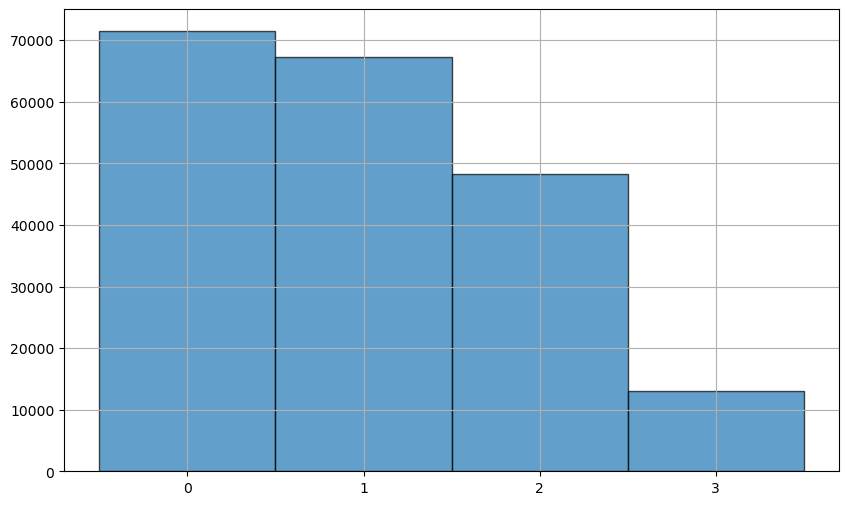

In [39]:
bins = np.arange(
    scores_df['pos_ftle'].min(), scores_df['pos_ftle'].max() + 2) - 0.5
scores_df['pos_ftle'].hist(bins=bins,
                           edgecolor='black', alpha=0.7, figsize=(10, 6))
plt.xticks(range(scores_df['pos_ftle'].min(), scores_df['pos_ftle'].max() + 1))

In [40]:
counts = scores_df['pos_ftle'].value_counts().sort_index()
print(counts)

pos_ftle
0    71450
1    67270
2    48283
3    12997
Name: count, dtype: int64


In [19]:
ax[0]

<Axes: >

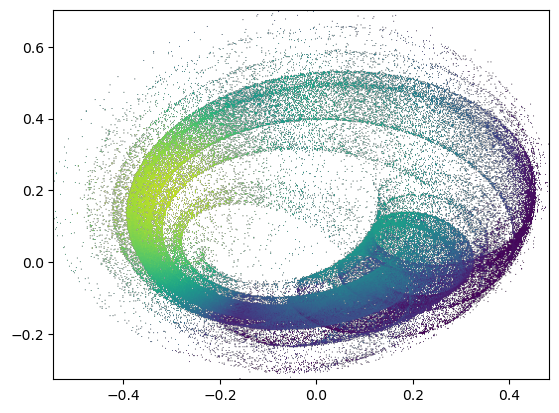

In [22]:
fig, ax = plt.subplots(1, 1)
ax.imshow(scatter_data_ftle_max[('PC1', 'PC2')]['img_array'],
          extent=scatter_data_ftle_max[('PC1', 'PC2')]['extent'],
          cmap=cmap_ftle_max, aspect='auto', origin='lower')

In [24]:
from multiprocessing import Pool, cpu_count


def save_single_frame(args):
    """Process a single time step frame with an option to use histograms or scatter"""
    (t, df_columns, data, state_vector_t, output_folder, cmap,
     variable_pairs, pc_state_t, X, Y) = args

    # Create figure for this time step
    fig = plt.figure(figsize=(15, 12))
    gs = fig.add_gridspec(4, 5, height_ratios=[3, 3, 3, 4])

    # Create axes
    axes = [fig.add_subplot(gs[row, col])
            for row in range(3) for col in range(5)]

    for idx, (var1, var2) in enumerate(variable_pairs):
        if idx >= len(axes):
            break

        ax = axes[idx]

        hist_data = data[(var1, var2)]
        ax.imshow(hist_data["img_array"],
                  extent=hist_data["extent"],
                  cmap=cmap,
                  aspect='auto', origin='lower')

        var1_idx = df_columns.get_loc(var1)
        var2_idx = df_columns.get_loc(var2)

        if pc_state_t is None:
            ax.scatter(
                state_vector_t[var1_idx], state_vector_t[var2_idx],
                color='red', s=20, alpha=0.7)
        else:
            ax.scatter(
                pc_state_t[var1_idx], pc_state_t[var2_idx],
                color='red', s=20, alpha=0.7)

        ax.set_xlabel(var1)
        ax.set_ylabel(var2)

    # Additional plot
    ax_beneath = fig.add_subplot(gs[3, :])
    mode = lin_comb(state_vector_t, X, Y)
    plotFourierMode(mode, X, Y, ax_beneath)

    # Save frame
    frame_filename = os.path.join(output_folder, f"frame_{t:03d}.png")
    plt.savefig(frame_filename, dpi=150)
    plt.close(fig)

    return f"Saved frame {t+1}: {frame_filename}"


def save_time_step_plots_parallel(df, data, state_vector,
                                  output_folder="frames",
                                  n_steps=1000, cmap='viridis_r',
                                  columns=None, n_processes=None,
                                  pc_state=None):
    """
    Parallel version using multiprocessing.Pool
    """
    # Setup
    os.makedirs(output_folder, exist_ok=True)

    if columns is None:
        x_columns = [col for col in df.columns
                     if str(col).startswith(('x', 'PC'))]
    else:
        x_columns = columns

    variable_pairs = list(combinations(x_columns, 2))

    if n_processes is None:
        n_processes = min(cpu_count(), n_steps)

    # Prepare arguments for each time step
    args_list = []
    for t in range(n_steps):
        if pc_state is None:
            args = (t, df.columns, data, state_vector[t, :],
                    output_folder, cmap, variable_pairs, pc_state,
                    X, Y)
        else:
            args = (t, df.columns, data, state_vector[t, :],
                    output_folder, cmap, variable_pairs, pc_state[t, :],
                    X, Y)
        args_list.append(args)

    # Process in parallel
    with Pool(processes=n_processes) as pool:
        results = pool.map(save_single_frame, args_list)

    for result in results:
        print(result)

In [8]:
def make_scatter_backgrounds(df, variable_pairs, color_var, categorical=False,
                             cmap='viridis_r', norm=None, bins=(500, 500)):
    """
    For each (var1, var2) in variable_pairs, bin the points in 2D,
    average their mapped colormap RGBA, and return a dict
    { (var1,var2): {'img_array': HxWx4 array, 'extent': (xmin,xmax,ymin,ymax)} }.
    """
    backgrounds = {}
    # If no norm given, set one over the full color_var range
    all_vals = df[color_var].values
    if norm is None:
        norm = Normalize(all_vals.min(), all_vals.max())
    cmap = cm.get_cmap(cmap)

    if categorical:
        # determine unique integer categories
        cats = np.sort(df[color_var].unique())
        n_cats = len(cats)

        # turn your colormap into a discrete one with n_cats bins
        cmap = plt.get_cmap(cmap, n_cats)

        # build a norm that maps each integer to its own colour bin
        # boundaries run from half-integer below the min to half-integer above the max
        boundaries = np.concatenate(([cats[0] - 0.5], cats + 0.5))
        norm = BoundaryNorm(boundaries, ncolors=n_cats)

    for var1, var2 in variable_pairs:
        x = df[var1].values
        y = df[var2].values
        v = df[color_var].values

        # map values → RGBA
        rgba_pts = cmap(norm(v))  # shape (N,4)

        # define bin edges
        xedges = np.linspace(x.min(), x.max(), bins[0] + 1)
        yedges = np.linspace(y.min(), y.max(), bins[1] + 1)

        # digitize positions to bin indices
        xi = np.searchsorted(xedges, x, side='right') - 1
        yi = np.searchsorted(yedges, y, side='right') - 1

        H, W = bins[1], bins[0]
        # accumulators
        sum_rgba = np.zeros((H, W, 4), dtype=np.float64)
        count = np.zeros((H, W),       dtype=np.int64)

        # accumulate
        for xx, yy, col in zip(xi, yi, rgba_pts):
            if 0 <= xx < W and 0 <= yy < H:
                sum_rgba[yy, xx] += col
                count[yy, xx] += 1

        # compute per‑pixel mean RGBA; leave empty pixels alpha=0
        nonzero = count > 0
        img = np.zeros((H, W, 4), dtype=np.float32)
        img[nonzero] = (sum_rgba[nonzero] /
                        count[nonzero][..., None])

        # extent = (xmin, xmax, ymin, ymax)
        extent = (xedges[0], xedges[-1], yedges[0], yedges[-1])

        backgrounds[(var1, var2)] = {
            'img_array': img,
            'extent': extent
        }

    return backgrounds, cmap


x_columns = [col for col in scores_df.columns
             if str(col).startswith(('x', 'PC'))]


variable_pairs = list(combinations(x_columns, 2))
scatter_data_ftle_max, cmap_ftle_max = make_scatter_backgrounds(
    scores_df, variable_pairs, color_var='ftle_max',  # or your third‑axis name
    cmap='viridis', bins=(500, 500)
)
scatter_data_pos_ftle, cmap_pos_ftle = make_scatter_backgrounds(
    scores_df, variable_pairs, categorical=True,
    color_var='pos_ftle',  # or your third‑axis name
    cmap='Set1', bins=(500, 500)
)

/tmp/ipykernel_19109/721266015.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap)


In [25]:
save_time_step_plots_parallel(scores_df, scatter_data_pos_ftle,
                              state_vector,
                              output_folder="frames",
                              n_steps=1000, cmap=cmap_pos_ftle, columns=None,
                              n_processes=24,
                              pc_state=scores_df.iloc[:, :6].values)

Saved frame 1: frames/frame_000.png
Saved frame 2: frames/frame_001.png
Saved frame 3: frames/frame_002.png
Saved frame 4: frames/frame_003.png
Saved frame 5: frames/frame_004.png
Saved frame 6: frames/frame_005.png
Saved frame 7: frames/frame_006.png
Saved frame 8: frames/frame_007.png
Saved frame 9: frames/frame_008.png
Saved frame 10: frames/frame_009.png
Saved frame 11: frames/frame_010.png
Saved frame 12: frames/frame_011.png
Saved frame 13: frames/frame_012.png
Saved frame 14: frames/frame_013.png
Saved frame 15: frames/frame_014.png
Saved frame 16: frames/frame_015.png
Saved frame 17: frames/frame_016.png
Saved frame 18: frames/frame_017.png
Saved frame 19: frames/frame_018.png
Saved frame 20: frames/frame_019.png
Saved frame 21: frames/frame_020.png
Saved frame 22: frames/frame_021.png
Saved frame 23: frames/frame_022.png
Saved frame 24: frames/frame_023.png
Saved frame 25: frames/frame_024.png
Saved frame 26: frames/frame_025.png
Saved frame 27: frames/frame_026.png
Saved fram

In [26]:
save_time_step_plots_parallel(scores_df, scatter_data_ftle_max,
                              state_vector,
                              output_folder="frames",
                              n_steps=1000, cmap=cmap_ftle_max, columns=None,
                              n_processes=24,
                              pc_state=scores_df.iloc[:, :6].values)

Saved frame 1: frames/frame_000.png
Saved frame 2: frames/frame_001.png
Saved frame 3: frames/frame_002.png
Saved frame 4: frames/frame_003.png
Saved frame 5: frames/frame_004.png
Saved frame 6: frames/frame_005.png
Saved frame 7: frames/frame_006.png
Saved frame 8: frames/frame_007.png
Saved frame 9: frames/frame_008.png
Saved frame 10: frames/frame_009.png
Saved frame 11: frames/frame_010.png
Saved frame 12: frames/frame_011.png
Saved frame 13: frames/frame_012.png
Saved frame 14: frames/frame_013.png
Saved frame 15: frames/frame_014.png
Saved frame 16: frames/frame_015.png
Saved frame 17: frames/frame_016.png
Saved frame 18: frames/frame_017.png
Saved frame 19: frames/frame_018.png
Saved frame 20: frames/frame_019.png
Saved frame 21: frames/frame_020.png
Saved frame 22: frames/frame_021.png
Saved frame 23: frames/frame_022.png
Saved frame 24: frames/frame_023.png
Saved frame 25: frames/frame_024.png
Saved frame 26: frames/frame_025.png
Saved frame 27: frames/frame_026.png
Saved fram

In [76]:
save_time_step_plots_parallel(scores_df, histograms,
                              state_vector,
                              output_folder="frames",
                              n_steps=1000, cmap='viridis_r', columns=None,
                              n_processes=30, pc_state=scores_df.iloc[:, :6].values)

Saved frame 1: frames/frame_000.png
Saved frame 2: frames/frame_001.png
Saved frame 3: frames/frame_002.png
Saved frame 4: frames/frame_003.png
Saved frame 5: frames/frame_004.png
Saved frame 6: frames/frame_005.png
Saved frame 7: frames/frame_006.png
Saved frame 8: frames/frame_007.png
Saved frame 9: frames/frame_008.png
Saved frame 10: frames/frame_009.png
Saved frame 11: frames/frame_010.png
Saved frame 12: frames/frame_011.png
Saved frame 13: frames/frame_012.png
Saved frame 14: frames/frame_013.png
Saved frame 15: frames/frame_014.png
Saved frame 16: frames/frame_015.png
Saved frame 17: frames/frame_016.png
Saved frame 18: frames/frame_017.png
Saved frame 19: frames/frame_018.png
Saved frame 20: frames/frame_019.png
Saved frame 21: frames/frame_020.png
Saved frame 22: frames/frame_021.png
Saved frame 23: frames/frame_022.png
Saved frame 24: frames/frame_023.png
Saved frame 25: frames/frame_024.png
Saved frame 26: frames/frame_025.png
Saved frame 27: frames/frame_026.png
Saved fram

# Have a look at way more data (Expensive, watch out!)

In [51]:
dims = 6
sample_num = 500000

combine_binary_files("./cdv_model/dataOro20_",
                     "./cdv_model/dataOro20_Large.bin",
                     dtype, dims, sample_num, 99)
combine_binary_files("./cdv_model/ftle_20_",
                     "./cdv_model/ftle_20_Large.bin",
                     dtype, dims, sample_num, 99)

Combined 99 files into ./cdv_model/dataOro20_Large.bin
New sample_num for combined file: 49500000
Combined 99 files into ./cdv_model/ftle_20_Large.bin
New sample_num for combined file: 49500000


In [63]:
combined_data = load_d("./cdv_model/dataOro20_Large.bin", 6, 500000*99)
df_Large = build_df(combined_data, dims)
results = compute_eof(df_Large, n_modes=6)
scores_df_Large = results['scores_df']
ftles_Large = load_d("./cdv_model/ftle_20_Large.bin", 6, 500000*99)
ftle_df_Large = build_df(ftles_Large)
df_Large["ftle_max"] = np.max(ftles_Large, axis=1)
df_Large["pos_ftle"] = np.sum(ftles_Large > 0, axis=1, dtype=int)
scores_df_Large["ftle_max"] = np.max(ftles_Large, axis=1)
scores_df_Large["pos_ftle"] = np.sum(ftles_Large > 0, axis=1, dtype=int)
x_lims = {'x_1': None, 'x_2': (-.15, .35), 'x_3': None, 'x_4': (None, -.15),
          'x_5': (-.5, None), 'x_6': (-.3, .6)}
pc_lims = {'PC1': (-.5, .5), 'PC2': (-.3, None), 'PC3': (-.3, .25),
           'PC4': (-.1, .3), 'PC5': (-.15, .2), 'PC6': (-.075, .1)}

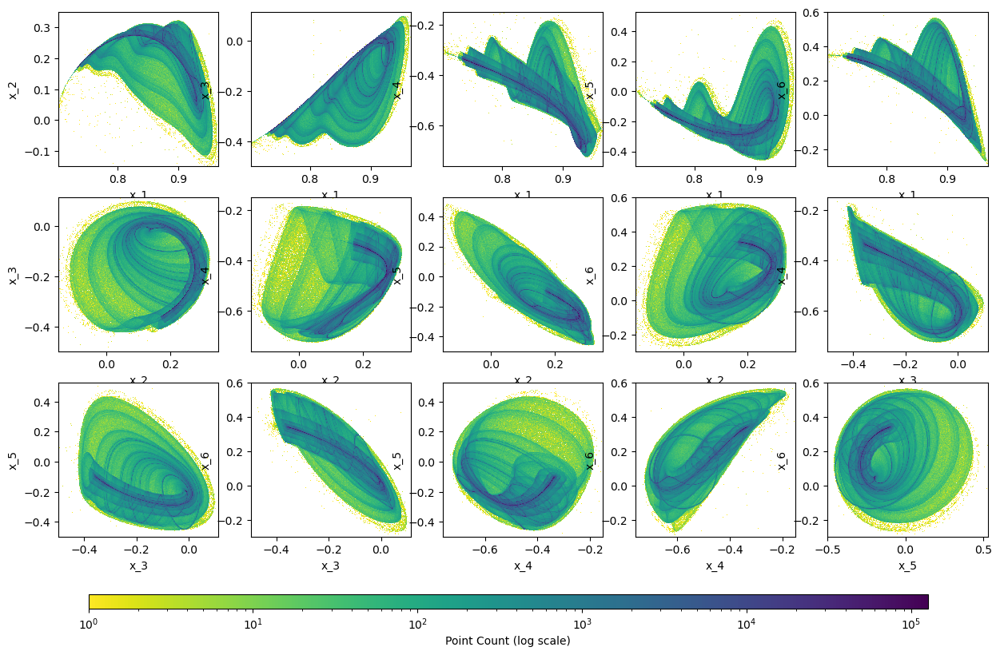

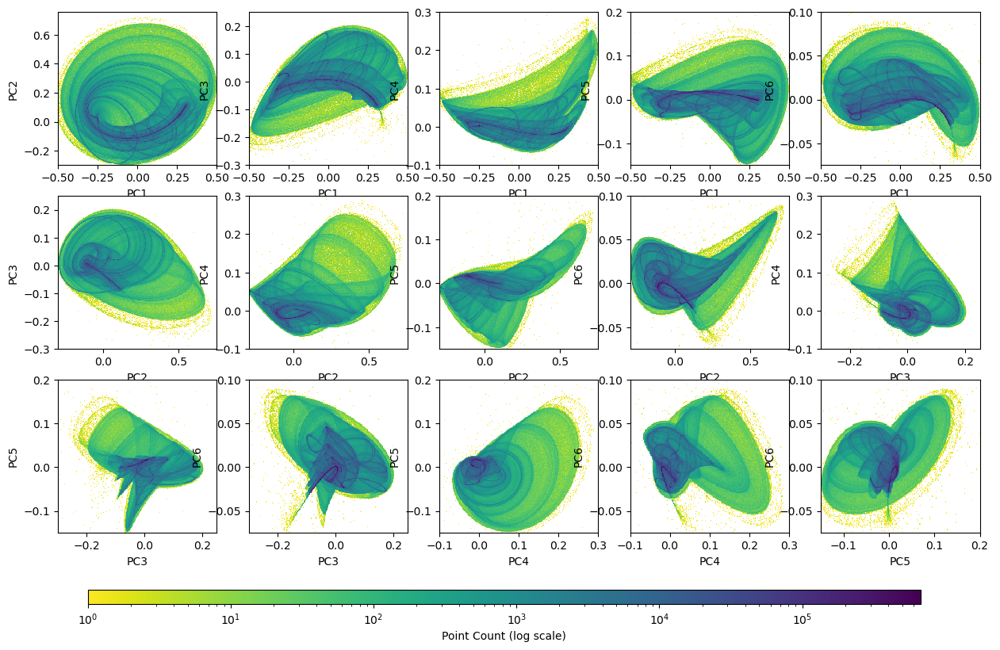

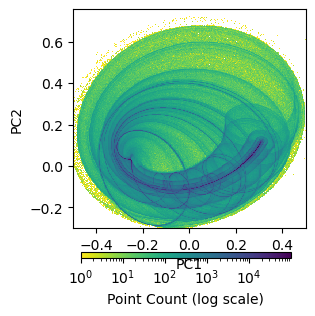

In [64]:
hists = plot_density_heatmap(df_Large, bins=500, axis_limits=x_lims)
histograms = plot_density_heatmap(scores_df_Large, bins=500,
                                  axis_limits=pc_lims)
histogram1 = plot_density_heatmap(
    scores_df_Large, bins=500, columns=['PC1', 'PC2'], axis_limits=pc_lims)

# Lets see how it looks in Diffusion Maps space

In [43]:
import numpy as np
from scipy.spatial import cKDTree
from scipy.sparse import csr_matrix, diags, identity
from scipy.sparse.linalg import eigsh
from scipy.sparse.linalg import eigs


def diffusion_maps(X, k=50, epsilon=None, alpha=1.0, n_eig=10):
    """
    Compute diffusion maps embedding of the data with density normalization.

    Parameters:
        X        : (N, D) array of N points in D dims
        k        : number of nearest neighbors
        epsilon  : kernel bandwidth; if None, uses median heuristic
        alpha    : density‐normalization exponent (1 = full sampling correction)
        n_eig    : number of diffusion coordinates to return

    Returns:
        eigvals          : (n_eig,) array of top eigenvalues
        diffusion_coords : (N, n_eig) array of corresponding eigenvectors
    """
    N = X.shape[0]

    # 1) build k-NN graph
    tree = cKDTree(X)
    dists, inds = tree.query(X, k=k+1)   # include self
    dists = dists[:, 1:]
    inds = inds[:, 1:]

    # plt.hist(dists.flatten(), bins=100)
    # 2) choose epsilon
    if epsilon is None:
        epsilon = np.median(dists)**2
        print(epsilon)

    # 3) build affinity W (symmetric)
    rows = np.repeat(np.arange(N), k)
    cols = inds.flatten()
    vals = np.exp(-dists.flatten()**2 / epsilon)
    W = csr_matrix((vals, (rows, cols)), shape=(N, N))
    W = W + identity(N) + W.T
    S = float(W.sum())
    W = W.multiply(1/W.sum(axis=1))
    # W = 0.5*(W + W.T)
    # # mask = W.data < 1e-3
    # # W.data[mask] = 0
    # # W.eliminate_zeros()
    # # 4) sampling‐density normalization: compute q_i = sum_j W_ij
    # q = np.array(W.sum(axis=1)).flatten()

    # # 5) reweight affinities: W_alpha = W_ij / (q_i q_j)^alpha
    # inv_q_alpha = (q**(-alpha))
    # D_alpha_inv = diags(inv_q_alpha)
    # W_tilde = D_alpha_inv @ W @ D_alpha_inv

    # # 6) form Markov matrix: row‐stochastic
    # d_tilde = np.array(W_tilde.sum(axis=1)).flatten()
    # D_tilde_inv = diags(1.0 / d_tilde)
    # P = D_tilde_inv @ W_tilde
    # plt.figure()
    # plt.spy(W, markersize=.005)
    # 7) eigendecomposition of P^T
    row_sums = np.array(W.sum(axis=1)).flatten()
    row_sums_safe = np.where(row_sums > 1e-12, row_sums, 1e-12)
    D_half_inv = diags(1.0/np.sqrt(row_sums_safe))
    P_sym = D_half_inv @ W @ D_half_inv
    eigvals, psi = eigsh(P_sym, k=n_eig, which='LM')
    # eigvals, eigvecs = eigs(W, k=n_eig)
    # 8) sort by descending eigenvalue
    # idx = np.argsort(-eigvals)
    # eigvals = eigvals[idx]
    # eigvecs = eigvecs[:, idx]
    eigvecs = D_half_inv @ psi

    # diffusion coords: psi * lambda^t; here t=1 so just psi * lambda
    # diffusion_coords = eigvecs * eigvals[np.newaxis, :]
    return eigvals, eigvecs, S
    # return eigvals, diffusion_coords, S

In [52]:
import numpy as np
from scipy.spatial import cKDTree
from scipy.sparse import csr_matrix, diags, identity
from scipy.sparse.linalg import eigsh, lobpcg


def diffusion_maps(X, k=50, epsilon=None, alpha=1.0, n_eig=10):
    """
    Compute diffusion maps embedding of the data with density normalization
    via a symmetric eigenproblem for robust ARPACK convergence.

    Parameters:
        X        : (N, D) array of N points in D dims
        k        : number of nearest neighbors
        epsilon  : kernel bandwidth; if None, uses median heuristic
        alpha    : sampling‐density normalization exponent (1 = full correction)
        n_eig    : number of diffusion coordinates to return

    Returns:
        eigvals          : (n_eig,) array of top eigenvalues
        diffusion_coords : (N, n_eig) right eigenvectors of P (i.e. the diffusion coords)
        S                : sum of all entries in the raw affinity W_raw
    """
    N = X.shape[0]

    # 1) build k-NN graph
    tree = cKDTree(X)
    dists, inds = tree.query(X, k=k+1)
    dists = dists[:, 1:]
    inds = inds[:, 1:]

    # 2) choose epsilon
    if epsilon is None:
        epsilon = np.median(dists)**2

    # 3) build raw symmetric affinity W_raw = W + I + W.T
    rows = np.repeat(np.arange(N), k)
    cols = inds.flatten()
    vals = np.exp(-dists.flatten()**2 / epsilon)
    W = csr_matrix((vals, (rows, cols)), shape=(N, N))
    W_raw = W + identity(N) + W.T

    # 4) sampling-density normalization (alpha)
    if alpha != 0:
        q = np.array(W_raw.sum(axis=1)).flatten()
        q_safe = q + 1e-12
        Dq_inv = diags(q_safe**(-alpha))
        W_raw = Dq_inv @ W_raw @ Dq_inv

    # 5) record total raw affinity sum (goes from ~N to ~N^2)
    S = float(W_raw.sum())

    # 6) form the symmetric normalization
    row_sums = np.array(W_raw.sum(axis=1)).flatten()
    row_sums_safe = np.where(row_sums > 1e-12, row_sums, 1e-12)
    D_half_inv = diags(1.0/np.sqrt(row_sums_safe))
    P_sym = D_half_inv @ W_raw @ D_half_inv

    X0 = np.random.randn(N, n_eig)
    eigvals, psi = lobpcg(P_sym, X0,
                          tol=1e-6,
                          maxiter=500,
                          largest=True)

    # 8) recover right eigenvectors of the original P
    eigvecs = D_half_inv @ psi

    # 9) diffusion coords at t=1: ψ * λ
    diffusion_coords = eigvecs * eigvals[np.newaxis, :]

    return eigvals, diffusion_coords, S

Built KDTree with 200000 points
Calculated neighbor counts for 200000 points


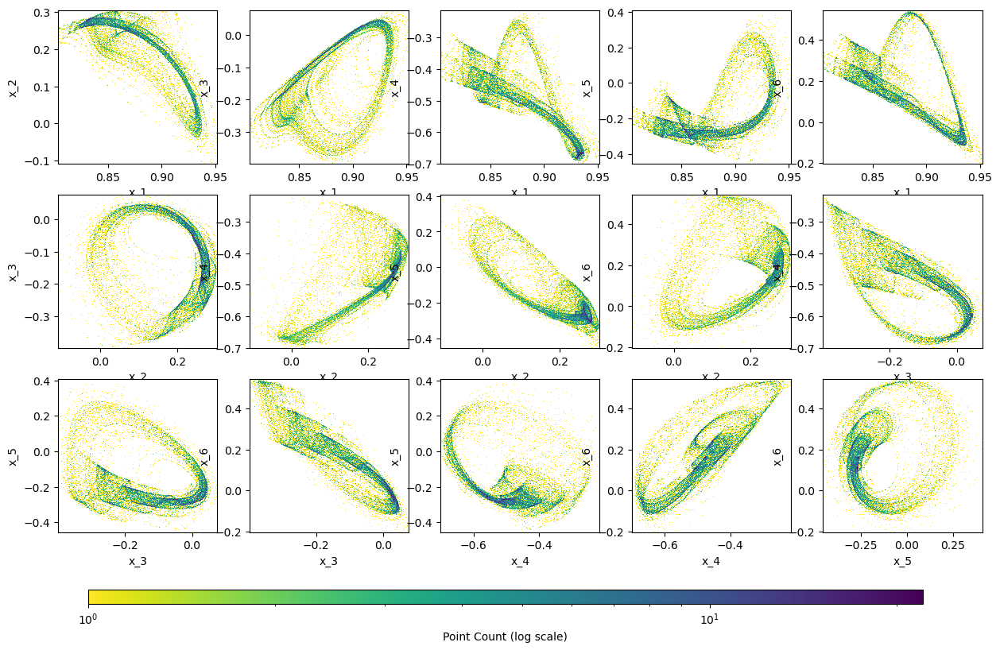

/tmp/ipykernel_535151/2248254193.py:60: UserWarning: Exited at iteration 500 with accuracies 
[2.42078635e-05 3.04574019e-05 2.68972301e-05 3.62958818e-05
 3.73432186e-05 4.99539596e-05]
not reaching the requested tolerance 1e-06.
Use iteration 494 instead with accuracy 
3.366955839113421e-05.

  eigvals, psi = lobpcg(P_sym, X0,
/tmp/ipykernel_535151/2248254193.py:60: UserWarning: Exited postprocessing with accuracies 
[2.57741578e-05 2.59211495e-05 2.77683033e-05 3.78175520e-05
 3.49011023e-05 4.98350854e-05]
not reaching the requested tolerance 1e-06.
  eigvals, psi = lobpcg(P_sym, X0,


In [53]:
N_small = 15000
state_small = state_vector[:N_small, ]
df_small = build_df(state_small)
results = compute_eof(df_small, n_modes=6)
scores_df_small = results['scores_df']
df_small = add_density_column(df_small, state_small, 0.01)
hists = plot_density_heatmap(df_small)
eval, diff_coords, S = diffusion_maps(
    state_small, k=64, n_eig=6, epsilon=1e-4)
# epss = np.logspace(-6, -1, num=10)
# S = np.zeros_like(epss)
# for i, eps in enumerate(epss):
#     print(eps)
#     eval, diff_coords, S[i] = diffusion_maps(
#         state_small, k=128, n_eig=6, epsilon=eps)
#     print(eval)

In [54]:
eval

array([0.99999964, 0.99999956, 0.99999938, 0.99999922, 0.99999908,
       0.99999852])

In [45]:
S

285343.29568976857

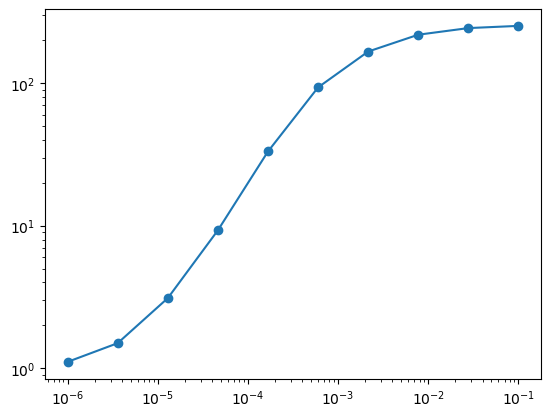

In [40]:
plt.loglog(epss, S / N_small, marker='o', linestyle='-')

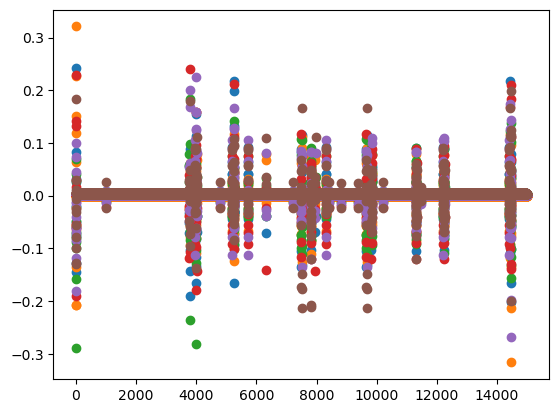

In [55]:
for i in range(6):
    plt.scatter(np.arange(N_small), diff_coords[:, i])

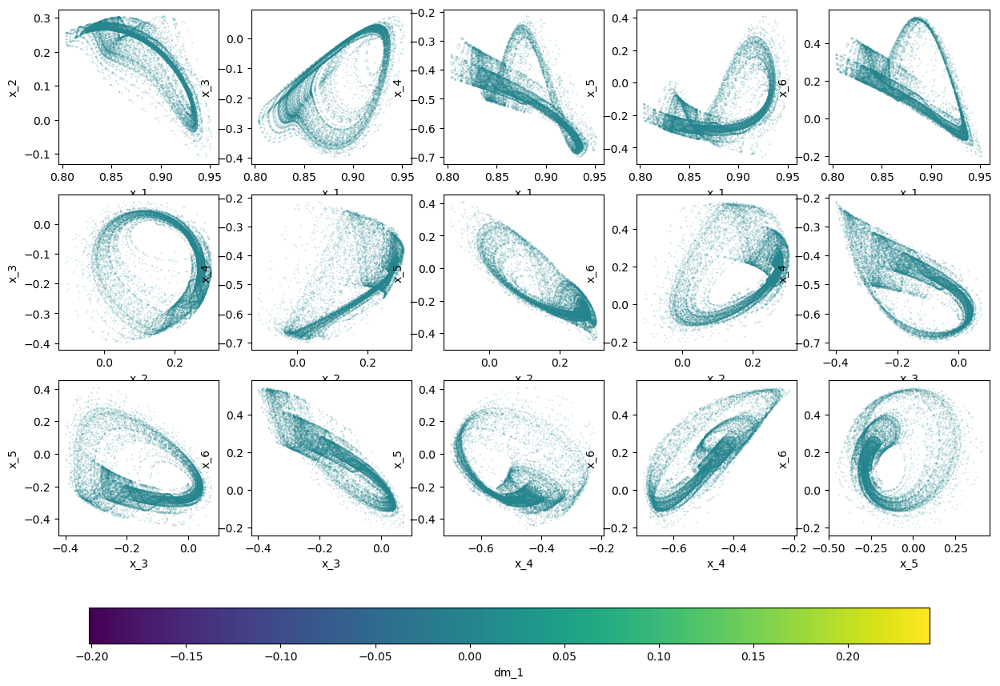

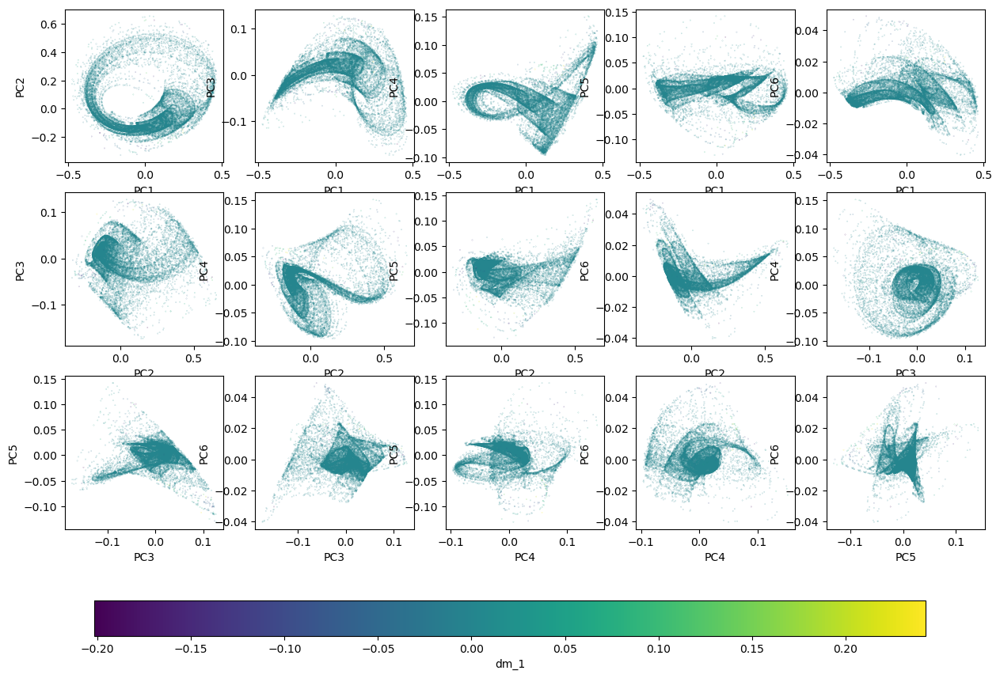

(<Figure size 1500x900 with 16 Axes>, <Axes: xlabel='PC5', ylabel='PC6'>)

In [56]:
dm_df = build_df(diff_coords)
df_small["dm_1"] = diff_coords[:, 0]
scores_df_small["dm_1"] = diff_coords[:, 0]
plot_scatter(df_small, "dm_1", cmap='viridis')
plot_scatter(scores_df_small, "dm_1", cmap='viridis')